# Segment Anything Model (SAM)
## Интерактивная сегментация одним кликом

### План семинара:
1. Что такое SAM
2. Сегментация по точкам (point prompts)
3. Сегментация по боксам (box prompts)
4. Сегментация всего на изображении (automatic mask generation)
5. Комбинация промптов
6. Практическое применение

SAM: Модель обучена на 11 млн изображений и может сегментировать ЛЮБОЙ объект по простому указанию (клик, бокс, текст)!


In [1]:
# Установка библиотек
%pip install -q segment-anything opencv-python matplotlib numpy torch torchvision
from huggingface_hub import hf_hub_download
hf_hub_download("ybelkada/segment-anything", "checkpoints/sam_vit_b_01ec64.pth", local_dir="")   
print("✅ Библиотеки установлены, модель скачана")

Note: you may need to restart the kernel to use updated packages.


checkpoints/sam_vit_b_01ec64.pth:   0%|          | 0.00/375M [00:00<?, ?B/s]

✅ Библиотеки установлены, модель скачана


In [2]:
# Импорт и настройка
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from segment_anything import SamPredictor, sam_model_registry, SamAutomaticMaskGenerator
from pathlib import Path
import requests
from PIL import Image
import io

# Настройка визуализации
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10

print("✅ Готово к работе!")

✅ Готово к работе!


## 1. Загрузка модели и изображения

In [3]:
# Инициализация SAM
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"🖥 Используем: {device}")

# Регистрируем модель (доступные: vit_h, vit_l, vit_b)
sam = sam_model_registry["vit_b"](checkpoint="checkpoints/sam_vit_b_01ec64.pth")
sam.to(device=device)
predictor = SamPredictor(sam)

print(f"✅ SAM загружен на {device}")

🖥 Используем: cuda
✅ SAM загружен на cuda


Размер изображения: (1200, 1800, 3)


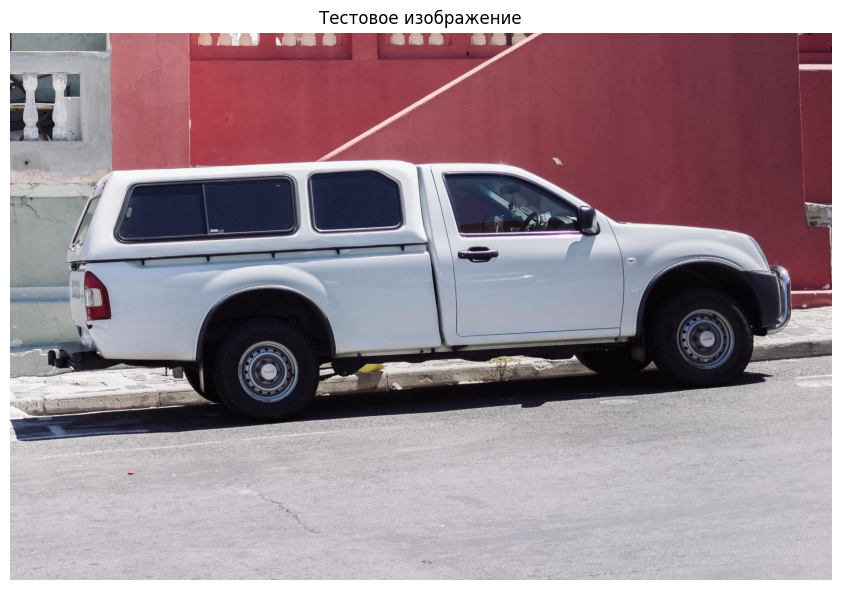

In [4]:
# Загружаем тестовое изображение
# Можно заменить на свое: image = cv2.imread("path/to/image.jpg")

url = "https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg"
response = requests.get(url)
image = np.array(Image.open(io.BytesIO(response.content)))

# Или загрузить свое изображение:
# image = cv2.imread("your_image.jpg")
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print(f"Размер изображения: {image.shape}")

plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.axis("off")
plt.title("Тестовое изображение")
plt.tight_layout()
plt.show()

In [5]:
# Устанавливаем изображение в predictor (это нужно сделать один раз)
predictor.set_image(image)
print("✅ Изображение установлено в модель")

✅ Изображение установлено в модель


## 2. Сегментация по ТОЧКАМ (Point Prompts)

### Задание 2.1: Сегментация объекта по одной точке

Укажите координаты точки (x, y) внутри объекта, который хотите выделить.

Найдено масок: 3
Scores: [0.9052571  0.95115453 0.98385394]


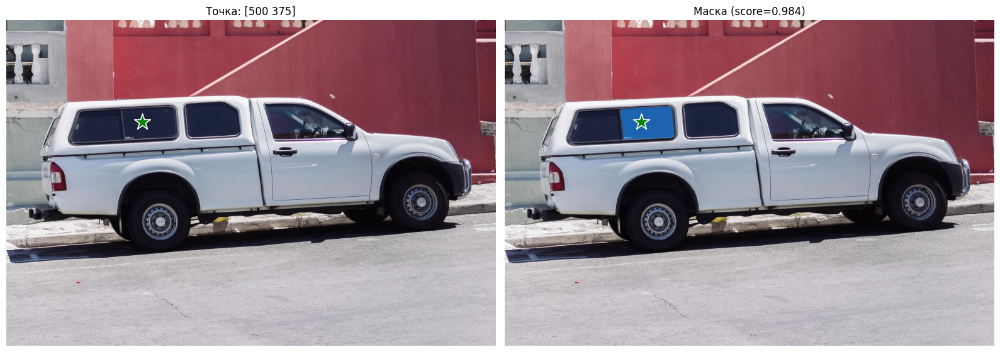

In [6]:
# Задаем точку (координаты x, y)
# Например, для грузовика: колесо, кабина, фара
input_point = np.array([[500, 375]])  # Координаты точки [x, y]
input_label = np.array([1])  # 1 = объект, 0 = фон

# Предсказание
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True  # Вернуть несколько вариантов
)

print(f"Найдено масок: {len(masks)}")
print(f"Scores: {scores}")

# Визуализация лучшей маски
best_mask_idx = np.argmax(scores)

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], c='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], c='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))

ax[0].imshow(image)
show_points(input_point, input_label, ax[0])
ax[0].set_title(f"Точка: {input_point[0]}", fontsize=12)
ax[0].axis("off")

ax[1].imshow(image)
show_mask(masks[best_mask_idx], ax[1])
show_points(input_point, input_label, ax[1])
ax[1].set_title(f"Маска (score={scores[best_mask_idx]:.3f})", fontsize=12)
ax[1].axis("off")

plt.tight_layout()
plt.show()

### 📝 Задание 2.2: Эксперимент с точками

Попробуйте:
1. Сегментировать колесо грузовика (поставьте точку на колесе)
2. Сегментировать кабину (точка на кабине)
3. Сегментировать фару (точка на фаре)
4. Попробуйте указать точку фона (label=0) и посмотрите, что произойдет

Вопросы для размышления:**
- Почему иногда SAM выдает несколько масок для одной точки?
- Как меняется результат в зависимости от расположения точки?

In [7]:
# 🎮 ВАШ КОД ЗДЕСЬ: Попробуйте разные точки
# Пример: точка на колесе (примерно [400, 450])

# input_point = np.array([[400, 450]])  # Измените координаты!
# input_label = np.array([1])

# masks, scores, logits = predictor.predict(
#     point_coords=input_point,
#     point_labels=input_label,
#     multimask_output=True
# )

# ... визуализация как выше ...

## 3. Сегментация по БОКСАМ (Box Prompts)

### Задание 3.1: Сегментация по bounding box

Задайте прямоугольник [x1, y1, x2, y2] вокруг объекта.

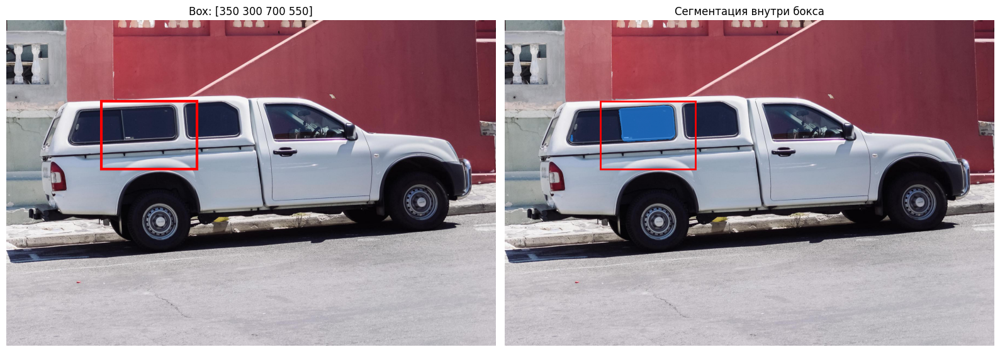

In [8]:
# Задаем bounding box [x1, y1, x2, y2]
input_box = np.array([350, 300, 700, 550])  # Пример: весь грузовик

# Предсказание
masks, scores, logits = predictor.predict(
    box=input_box[None, :],  # Добавляем размерность
    multimask_output=False
)

# Визуализация
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

ax[0].imshow(image)
ax[0].add_patch(plt.Rectangle((input_box[0], input_box[1]), 
                               input_box[2]-input_box[0], 
                               input_box[3]-input_box[1],
                               fill=False, edgecolor='red', linewidth=3))
ax[0].set_title(f"Box: {input_box}", fontsize=12)
ax[0].axis("off")

ax[1].imshow(image)
show_mask(masks[0], ax[1])
ax[1].add_patch(plt.Rectangle((input_box[0], input_box[1]), 
                               input_box[2]-input_box[0], 
                               input_box[3]-input_box[1],
                               fill=False, edgecolor='red', linewidth=2))
ax[1].set_title("Сегментация внутри бокса", fontsize=12)
ax[1].axis("off")

plt.tight_layout()
plt.show()

### Задание 3.2: Сегментация нескольких объектов

Попробуйте задать несколько боксов для разных объектов одновременно!

📊 Найдено масок: 2


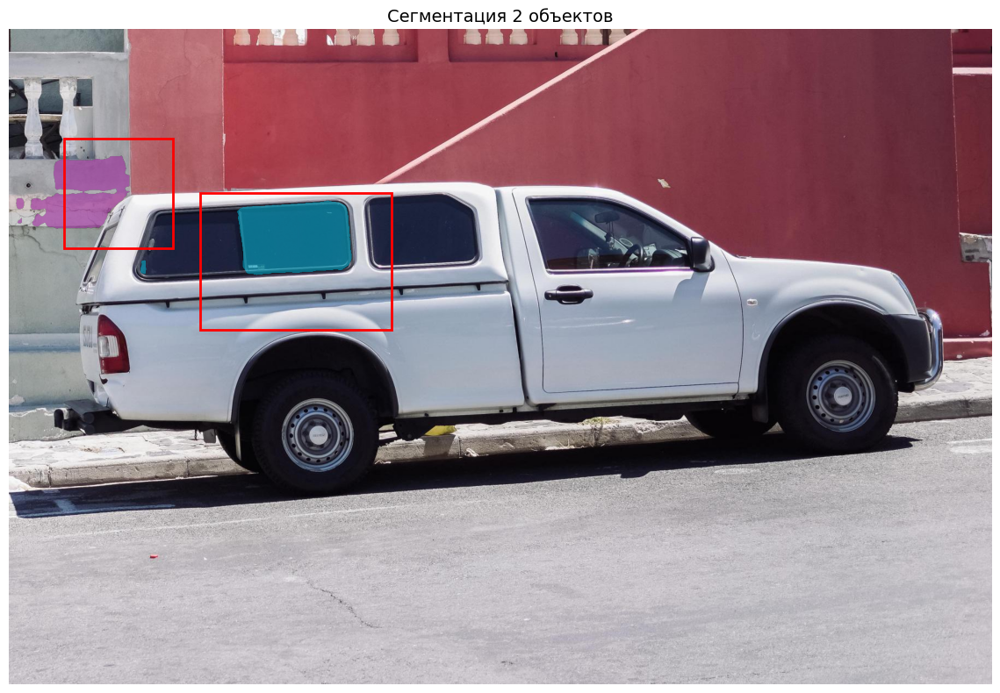

In [9]:
# 📦 Несколько боксов — вызываем predict для каждого отдельно
input_boxes = np.array([
    [350, 300, 700, 550],  # Грузовик
    [100, 200, 300, 400],  # Что-то еще на изображении
], dtype=np.float32)  # Важно: float32!

all_masks = []
all_scores = []

for box in input_boxes:
    masks, scores, logits = predictor.predict(
        box=box[None, :],  # Добавляем измерение батча (1, 4)
        multimask_output=False
    )
    all_masks.append(masks[0])
    all_scores.append(scores[0])

print(f"📊 Найдено масок: {len(all_masks)}")

# Визуализация
plt.figure(figsize=(12, 8))
plt.imshow(image)

for i, (mask, box) in enumerate(zip(all_masks, input_boxes)):
    show_mask(mask, plt.gca(), random_color=True)
    plt.gca().add_patch(plt.Rectangle((box[0], box[1]), 
                                       box[2]-box[0], box[3]-box[1],
                                       fill=False, edgecolor='red', linewidth=2))

plt.title(f"Сегментация {len(all_masks)} объектов", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()

## 4. Автоматическая сегментация ВСЕГО (Automatic Mask Generation)

SAM может автоматически найти ВСЕ объекты на изображении без каких-либо промптов!

In [10]:
# Создаем автоматический генератор масок
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,  # Сколько точек генерировать на сторону (больше = точнее, но медленнее)
    pred_iou_thresh=0.86,  # Порог качества масок (0-1)
    stability_score_thresh=0.92,  # Порог стабильности
    crop_n_layers=1,  # Сколько слоев кропа использовать
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Минимальная площадь маски
)

print("✅ Генератор создан")

✅ Генератор создан


In [11]:
# Генерируем все маски (это может занять 10-30 секунд)
print("Генерируем маски...")
masks_auto = mask_generator.generate(image)

print(f"Найдено объектов: {len(masks_auto)}")
print(f"Средняя площадь маски: {np.mean([m['area'] for m in masks_auto]):.0f} пикселей")

Генерируем маски...
Найдено объектов: 83
Средняя площадь маски: 37228 пикселей


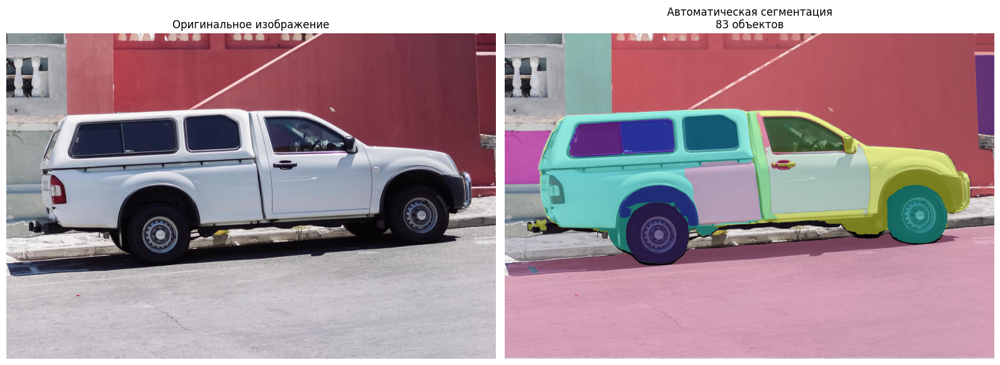

In [12]:
# Визуализация всех масок
def show_anns(anns, ax):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    
    ax.set_autoscale_on(False)
    img = np.ones((sorted_anns[0]['segmentation'].shape[0], 
                   sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    
    for ann in sorted_anns[:20]:  # Показываем топ-20 по площади
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask
    
    ax.imshow(img)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))

ax[0].imshow(image)
ax[0].set_title("Оригинальное изображение", fontsize=12)
ax[0].axis("off")

ax[1].imshow(image)
show_anns(masks_auto, ax[1])
ax[1].set_title(f"Автоматическая сегментация\n{len(masks_auto)} объектов", fontsize=12)
ax[1].axis("off")

plt.tight_layout()
plt.show()

### Задание 4.1: Анализ автоматической сегментации

Попробуйте изменить параметры генератора:
1. `points_per_side=16` (быстрее, но менее точно)
2. `points_per_side=64` (медленнее, но детальнее)
3. `pred_iou_thresh=0.5` (больше масок, но больше шума)
4. `pred_iou_thresh=0.95` (только очень качественные маски)

Сравните количество и качество масок!

## 5. Практическое применение: Интерактивная сегментация

### Задание 5.1: Выделение объекта интереса

Представьте, что вы разрабатываете инструмент для дизайнеров. Пользователь кликает на объект, а SAM его выделяет.

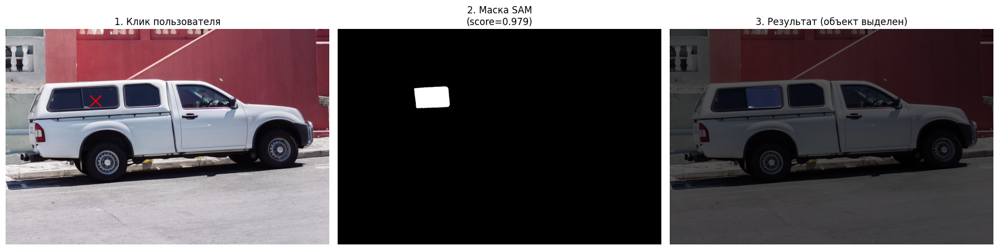

✅ Объект выделен! Площадь: 21535 пикселей


In [13]:
# Сценарий: Пользователь кликает на объект
# Симулируем клик пользователя (задайте координаты)
user_click = np.array([[500, 400]])  # Где кликнул пользователь
user_label = np.array([1])  # 1 = хочу выделить этот объект

# SAM находит объект
masks, scores, logits = predictor.predict(
    point_coords=user_click,
    point_labels=user_label,
    multimask_output=True
)

# Выбираем лучшую маску
best_idx = np.argmax(scores)
best_mask = masks[best_idx]

# Создаем маску для применения фильтров
masked_image = image.copy()
masked_image[~best_mask] = masked_image[~best_mask] // 3  # Затемняем фон

# Визуализация
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

ax[0].imshow(image)
ax[0].scatter(user_click[:, 0], user_click[:, 1], c='red', s=200, marker='x')
ax[0].set_title("1. Клик пользователя", fontsize=12)
ax[0].axis("off")

ax[1].imshow(best_mask, cmap='gray')
ax[1].set_title(f"2. Маска SAM\n(score={scores[best_idx]:.3f})", fontsize=12)
ax[1].axis("off")

ax[2].imshow(masked_image)
ax[2].set_title("3. Результат (объект выделен)", fontsize=12)
ax[2].axis("off")

plt.tight_layout()
plt.show()

print(f"✅ Объект выделен! Площадь: {np.sum(best_mask)} пикселей")

## 6. Сравнение методов

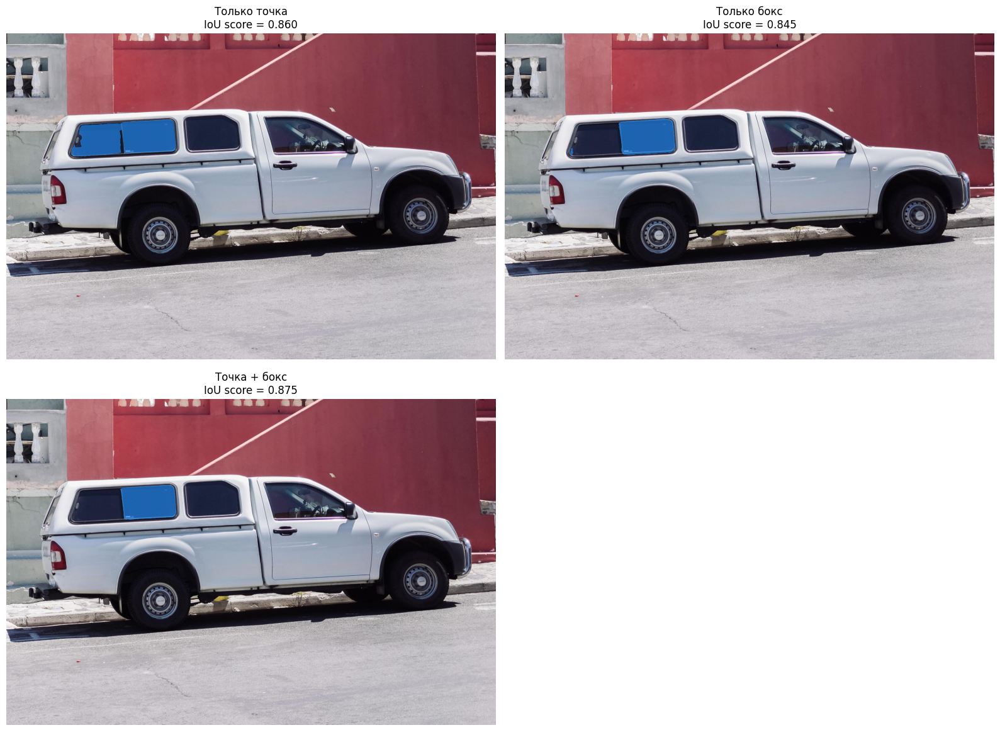

💡 Вывод: Комбинация промптов часто дает лучший результат!


In [14]:
# Сравним три подхода на одном объекте

# 1. Точка
point = np.array([[500, 375]])
masks_point, scores_point, _ = predictor.predict(
    point_coords=point, point_labels=np.array([1]), multimask_output=False
)

# 2. Бокс
box = np.array([350, 300, 700, 550])
masks_box, scores_box, _ = predictor.predict(
    box=box[None, :], multimask_output=False
)

# 3. Точка + бокс вместе!
masks_combined, scores_combined, _ = predictor.predict(
    point_coords=point,
    point_labels=np.array([1]),
    box=box[None, :],
    multimask_output=False
)

# Визуализация сравнения
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

methods = [
    ("Только точка", masks_point[0], scores_point[0]),
    ("Только бокс", masks_box[0], scores_box[0]),
    ("Точка + бокс", masks_combined[0], scores_combined[0]),
]

for idx, (title, mask, score) in enumerate(methods):
    ax = axes[idx // 2, idx % 2]
    ax.imshow(image)
    show_mask(mask, ax)
    ax.set_title(f"{title}\nIoU score = {score:.3f}", fontsize=12)
    ax.axis("off")

# Пустой subplot для красоты
axes[1, 1].axis("off")

plt.tight_layout()
plt.show()

print("💡 Вывод: Комбинация промптов часто дает лучший результат!")

## Домашнее Задание

**Задание 1: Интерактивный инструмент**

Создайте функцию, которая:
1. Принимает изображение и список точек (кликов пользователя)
2. Для каждой точки определяет, к какому объекту она относится
3. Возвращает:
   - Количество уникальных объектов, которые выделил пользователь
   - Общую площадь выделенных объектов
   - Визуализацию с разными цветами для каждого объекта

**Задание 2: Анализ качества**

1. Возьмите 3 разных изображения (природа, город, люди)
2. Для каждого изображения:
   - Запустите автоматическую сегментацию
   - Подсчитайте количество найденных объектов
   - Найдите средний IoU score
   - Сохраните статистику
3. Постройте график: "Тип изображения vs Количество объектов"
4. Сделайте вывод: на каких изображениях SAM работает лучше/хуже?

**Задание 3**

| Трек | Задание |
|------|---------|
| Creative** | Создайте "умное размытие фона": выделите главный объект точкой, размойте все остальное (эффект портретного режима) |
| Analytical | Реализуйте подсчет объектов определенного типа (например, "сколько машин на парковке") используя SAM + простые эвристики |
| Performance | Сравните скорость и качество трех моделей SAM: ViT-B, ViT-L, ViT-H. Постройте график "время vs качество" |


---

### Критерии оценки:
- Код работает без ошибок (20%)
- Правильное использование SAM API (30%)
- Качество визуализаций (20%)
- Глубина анализа и выводов (20%)
- Оформление и комментарии (10%)

### Формат сдачи:
- .ipynb файл с кодом и результатами
- 2-3 абзаца выводов
- Скриншоты результатов

## Полезные советы

### Частые проблемы:
1. CUDA out of memory → Используйте vit_b вместо vit_h, уменьшите `points_per_side`
2. Пустые маски → Проверьте, что точки/боксы внутри изображения
3. Медленная работа → Уменьшите `points_per_side` или используйте CPU для небольших изображений

### Ресурсы:
- [Официальный репозиторий SAM](https://github.com/facebookresearch/segment-anything)
[Demo SAM](https://segment-anything.com/demo) — попробуйте онлайн!
- [Paper SAM](https://arxiv.org/abs/2304.02643) — для тех, кто хочет понять internals
- [SA-1B Dataset](https://segment-anything.com/dataset/index.html) — 1.1 млрд масок!


In [15]:


import os
import io
import gc
import time
import math
from pathlib import Path

import cv2
import numpy as np
import matplotlib.pyplot as plt
import requests
from PIL import Image

try:
    import pandas as pd
except ImportError:
    !pip install -q pandas
    import pandas as pd


def load_rgb_image(source, max_side=900):
    """
    Loads image from URL or local path and returns RGB numpy array.
    Resizes so the largest side <= max_side to keep SAM runtime reasonable.
    """
    if str(source).startswith("http"):
        response = requests.get(source, timeout=30)
        response.raise_for_status()
        img = Image.open(io.BytesIO(response.content)).convert("RGB")
    else:
        img = Image.open(source).convert("RGB")

    w, h = img.size
    scale = min(1.0, max_side / max(w, h))
    if scale < 1.0:
        img = img.resize((int(w * scale), int(h * scale)), Image.Resampling.LANCZOS)

    return np.array(img)


def mask_iou(mask_a, mask_b):
    """IoU between two boolean masks."""
    mask_a = mask_a.astype(bool)
    mask_b = mask_b.astype(bool)
    intersection = np.logical_and(mask_a, mask_b).sum()
    union = np.logical_or(mask_a, mask_b).sum()
    return float(intersection / union) if union > 0 else 0.0


def overlay_masks(image_rgb, masks, alpha=0.55, seed=42):
    """
    Creates a colored overlay for a list of boolean masks.
    """
    rng = np.random.default_rng(seed)
    overlay = image_rgb.copy().astype(np.float32)

    for mask in masks:
        color = rng.integers(0, 255, size=3).astype(np.float32)
        mask = mask.astype(bool)
        overlay[mask] = overlay[mask] * (1 - alpha) + color * alpha

    return np.clip(overlay, 0, 255).astype(np.uint8)


def make_auto_mask_generator(
    model,
    points_per_side=16,
    pred_iou_thresh=0.86,
    stability_score_thresh=0.92,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=150,
):
    """
    Smaller default points_per_side=16 is used for homework speed.
    Increase to 32 or 64 for more detailed results.
    """
    return SamAutomaticMaskGenerator(
        model=model,
        points_per_side=points_per_side,
        pred_iou_thresh=pred_iou_thresh,
        stability_score_thresh=stability_score_thresh,
        crop_n_layers=crop_n_layers,
        crop_n_points_downscale_factor=crop_n_points_downscale_factor,
        min_mask_region_area=min_mask_region_area,
    )


print("✅ Homework helper functions loaded")

✅ Homework helper functions loaded


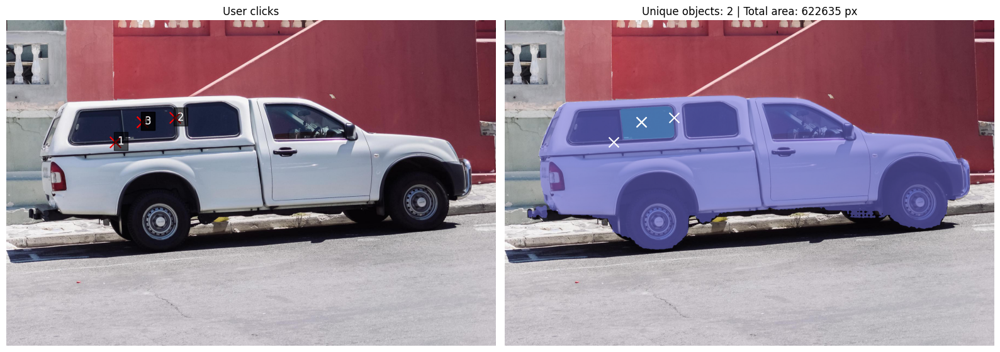

Количество уникальных объектов: 2
Общая площадь выделенных объектов: 622635 пикселей
Соответствие кликов объектам: [0, 1, 0, 0]
Scores объектов: [0.984 0.949]


In [ ]:
# ============================================
# TASK 1: INTERACTIVE TOOL FROM USER CLICKS
# ============================================

def segment_objects_from_clicks(
    image_rgb,
    clicks,
    predictor=predictor,
    labels=None,
    duplicate_iou_threshold=0.75,
    multimask_output=True,
    visualize=True,
):
    """
    Takes an image and a list of user clicks.
    For each click, SAM predicts an object mask.
    Similar masks are merged as the same unique object.

    Parameters:
        image_rgb: RGB image as numpy array
        clicks: list of [x, y] coordinates
        predictor: existing SamPredictor
        labels: optional list of labels, 1=foreground, 0=background
        duplicate_iou_threshold: if IoU with an existing mask is above this,
                                 the click is assigned to that existing object
        multimask_output: True gives several candidate masks, best score is selected
        visualize: whether to plot the result

    Returns:
        result dictionary with:
            - unique_object_count
            - total_area_pixels
            - unique_masks
            - click_to_object
            - object_scores
            - union_mask
    """
    clicks = np.array(clicks, dtype=np.float32)

    if labels is None:
        labels = np.ones(len(clicks), dtype=np.int32)
    else:
        labels = np.array(labels, dtype=np.int32)

    predictor.set_image(image_rgb)

    unique_masks = []
    object_scores = []
    click_to_object = []

    for i, (point, label) in enumerate(zip(clicks, labels)):
        if label == 0:
            print(f"Click {i}: label=0 is a background prompt, skipping object creation.")
            click_to_object.append(None)
            continue

        point_arr = point.reshape(1, 2)
        label_arr = np.array([label], dtype=np.int32)

        masks, scores, logits = predictor.predict(
            point_coords=point_arr,
            point_labels=label_arr,
            multimask_output=multimask_output,
        )

        best_idx = int(np.argmax(scores))
        new_mask = masks[best_idx].astype(bool)
        new_score = float(scores[best_idx])

        # Check whether this click refers to an already found object
        assigned_object = None
        best_existing_iou = 0.0

        for obj_idx, existing_mask in enumerate(unique_masks):
            current_iou = mask_iou(new_mask, existing_mask)
            if current_iou > best_existing_iou:
                best_existing_iou = current_iou
                assigned_object = obj_idx

        if assigned_object is not None and best_existing_iou >= duplicate_iou_threshold:
            # Same object. Keep the higher-scoring mask.
            if new_score > object_scores[assigned_object]:
                unique_masks[assigned_object] = new_mask
                object_scores[assigned_object] = new_score

            click_to_object.append(assigned_object)
        else:
            unique_masks.append(new_mask)
            object_scores.append(new_score)
            click_to_object.append(len(unique_masks) - 1)

    if len(unique_masks) > 0:
        union_mask = np.logical_or.reduce(unique_masks)
        total_area_pixels = int(union_mask.sum())
    else:
        union_mask = np.zeros(image_rgb.shape[:2], dtype=bool)
        total_area_pixels = 0

    result = {
        "unique_object_count": len(unique_masks),
        "total_area_pixels": total_area_pixels,
        "unique_masks": unique_masks,
        "click_to_object": click_to_object,
        "object_scores": object_scores,
        "union_mask": union_mask,
    }

    if visualize:
        fig, axes = plt.subplots(1, 2, figsize=(16, 7))

        axes[0].imshow(image_rgb)
        axes[0].scatter(clicks[:, 0], clicks[:, 1], c="red", s=160, marker="x")
        for idx, (x, y) in enumerate(clicks):
            axes[0].text(x + 8, y + 8, str(idx), color="white", fontsize=12,
                         bbox=dict(facecolor="black", alpha=0.6))
        axes[0].set_title("User clicks")
        axes[0].axis("off")

        colored = overlay_masks(image_rgb, unique_masks, alpha=0.55, seed=42)
        axes[1].imshow(colored)
        axes[1].scatter(clicks[:, 0], clicks[:, 1], c="white", s=130, marker="x")
        axes[1].set_title(
            f"Unique objects: {len(unique_masks)} | Total area: {total_area_pixels} px"
        )
        axes[1].axis("off")

        plt.tight_layout()
        plt.show()

    return result


# Example clicks for the existing truck image.
task1_clicks = [
    [500, 375],  # truck body / side
    [400, 450],  # wheel
    [620, 360],  # cabin/front area
    [500, 375],  # repeated 
]

task1_result = segment_objects_from_clicks(
    image_rgb=image,
    clicks=task1_clicks,
    predictor=predictor,
    duplicate_iou_threshold=0.75,
    visualize=True,
)

print("Количество уникальных объектов:", task1_result["unique_object_count"])
print("Общая площадь выделенных объектов:", task1_result["total_area_pixels"], "пикселей")
print("Соответствие кликов объектам:", task1_result["click_to_object"])
print("Scores объектов:", np.round(task1_result["object_scores"], 3))

nature: (300, 451, 3)
city: (566, 850, 3)
people: (512, 512, 3)

Generating masks for: nature

Generating masks for: city

Generating masks for: people


,image_type,object_count,mean_predicted_iou,mean_stability_score,mean_area_pixels,runtime_sec
0,nature,20,0.936152,0.947639,7123.450000,4.212407
1,city,47,0.932469,0.961963,13560.234043,4.797516
2,people,40,0.943601,0.961027,8158.175000,4.451931


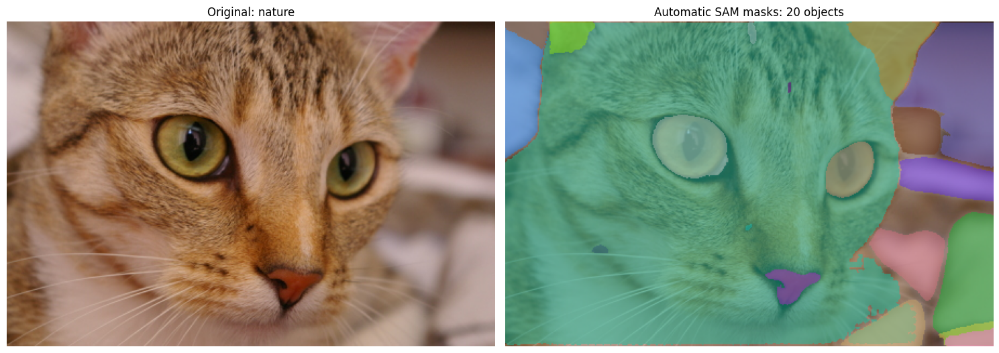

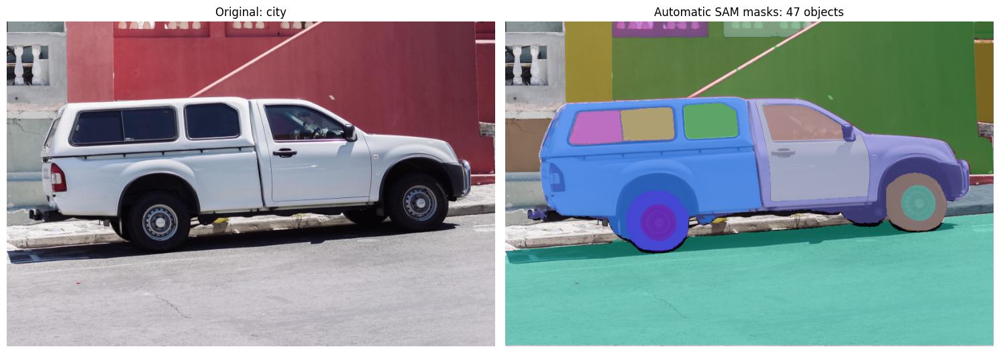

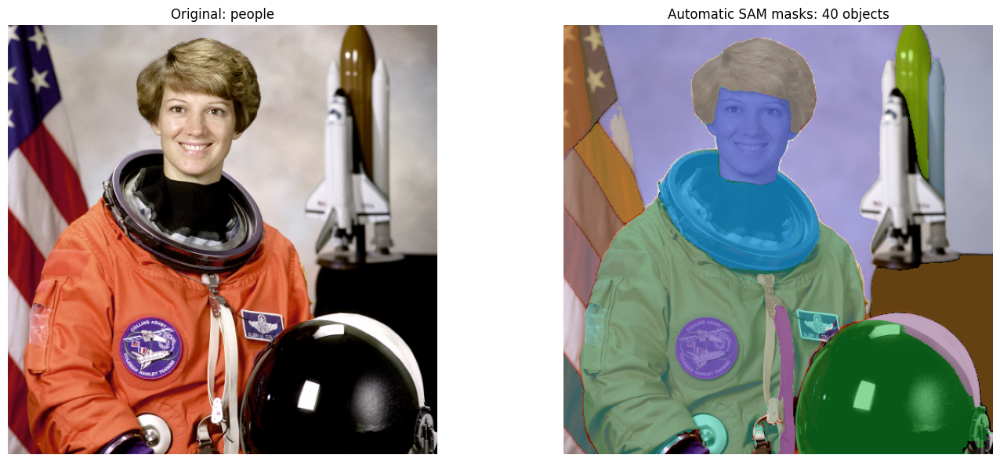

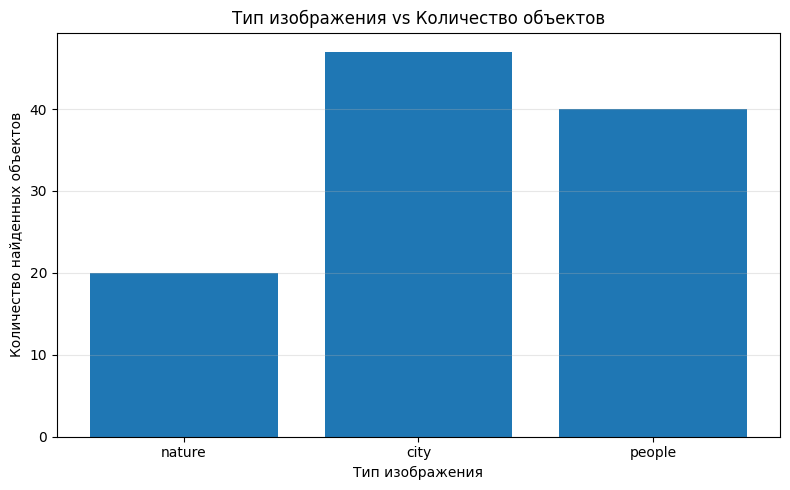

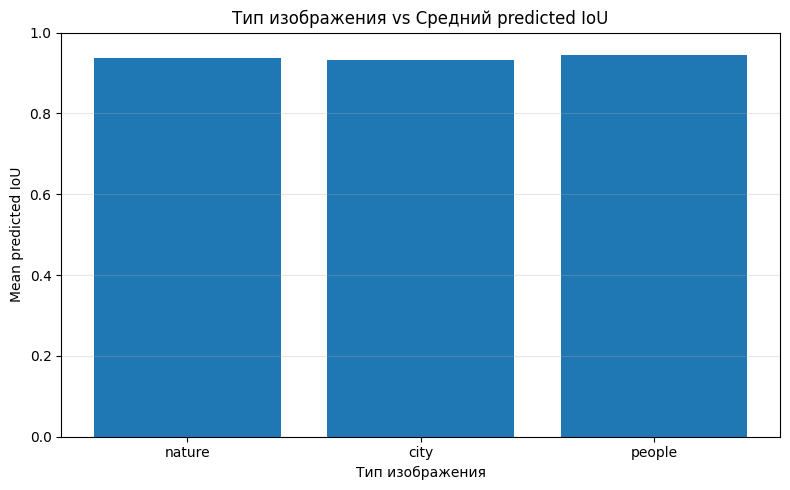

In [ ]:
# ==================================================
# TASK 2: QUALITY ANALYSIS ON NATURE / CITY / PEOPLE
# ==================================================

from skimage import data
import cv2
import numpy as np

def resize_rgb(img, max_side=850):
    img = np.asarray(img)

    if img.ndim == 2:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    if img.shape[-1] == 4:
        img = img[:, :, :3]

    img = img.astype(np.uint8)

    h, w = img.shape[:2]
    scale = min(1.0, max_side / max(h, w))

    if scale < 1.0:
        img = cv2.resize(
            img,
            (int(w * scale), int(h * scale)),
            interpolation=cv2.INTER_AREA,
        )

    return img


analysis_images = {
    "nature": resize_rgb(data.chelsea(), max_side=850),
    "city": resize_rgb(image, max_side=850),          # existing truck image from notebook
    "people": resize_rgb(data.astronaut(), max_side=850),
}

for image_type, img in analysis_images.items():
    print(f"{image_type}: {img.shape}")

analysis_generator = make_auto_mask_generator(
    model=sam,
    points_per_side=16,
    pred_iou_thresh=0.86,
    stability_score_thresh=0.92,
    crop_n_layers=1,
    min_mask_region_area=150,
)

stats = []
all_generated_masks = {}

for image_type, img_rgb in analysis_images.items():
    print(f"\nGenerating masks for: {image_type}")
    start_time = time.perf_counter()
    anns = analysis_generator.generate(img_rgb)
    elapsed = time.perf_counter() - start_time

    all_generated_masks[image_type] = anns

    object_count = len(anns)
    mean_iou = float(np.mean([ann["predicted_iou"] for ann in anns])) if anns else 0.0
    mean_stability = float(np.mean([ann["stability_score"] for ann in anns])) if anns else 0.0
    mean_area = float(np.mean([ann["area"] for ann in anns])) if anns else 0.0

    stats.append({
        "image_type": image_type,
        "object_count": object_count,
        "mean_predicted_iou": mean_iou,
        "mean_stability_score": mean_stability,
        "mean_area_pixels": mean_area,
        "runtime_sec": elapsed,
    })

stats_df = pd.DataFrame(stats)
display(stats_df)

# Visualization: original images + top masks
for image_type, img_rgb in analysis_images.items():
    anns = all_generated_masks[image_type]
    top_masks = [
        ann["segmentation"]
        for ann in sorted(anns, key=lambda x: x["area"], reverse=True)[:20]
    ]

    colored = overlay_masks(img_rgb, top_masks, alpha=0.50, seed=42)

    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    axes[0].imshow(img_rgb)
    axes[0].set_title(f"Original: {image_type}")
    axes[0].axis("off")

    axes[1].imshow(colored)
    axes[1].set_title(f"Automatic SAM masks: {len(anns)} objects")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

plt.figure(figsize=(8, 5))
plt.bar(stats_df["image_type"], stats_df["object_count"])
plt.title("Тип изображения vs Количество объектов")
plt.xlabel("Тип изображения")
plt.ylabel("Количество найденных объектов")
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5))
plt.bar(stats_df["image_type"], stats_df["mean_predicted_iou"])
plt.title("Тип изображения vs Средний predicted IoU")
plt.xlabel("Тип изображения")
plt.ylabel("Mean predicted IoU")
plt.ylim(0, 1)
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

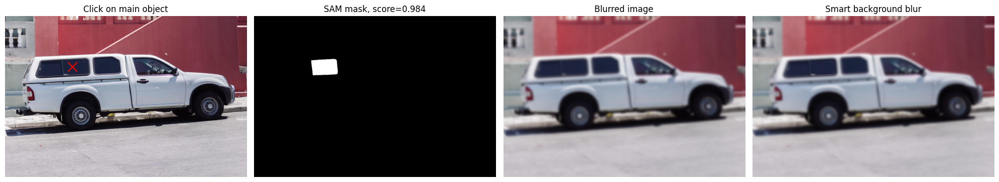

Площадь главного объекта: 21589 пикселей
Score: 0.984


In [ ]:
# ============================================================
# TASK 3 CREATIVE: SMART BACKGROUND BLUR / PORTRAIT MODE EFFECT
# ============================================================

def smart_background_blur(
    image_rgb,
    click,
    predictor=predictor,
    blur_kernel=51,
    feather_kernel=31,
    visualize=True,
):
    """
    Selects main object by one click with SAM and blurs everything else.
    """
    if blur_kernel % 2 == 0:
        blur_kernel += 1
    if feather_kernel % 2 == 0:
        feather_kernel += 1

    click = np.array(click, dtype=np.float32).reshape(1, 2)
    label = np.array([1], dtype=np.int32)

    predictor.set_image(image_rgb)

    masks, scores, logits = predictor.predict(
        point_coords=click,
        point_labels=label,
        multimask_output=True,
    )

    best_idx = int(np.argmax(scores))
    mask = masks[best_idx].astype(bool)
    score = float(scores[best_idx])

    blurred = cv2.GaussianBlur(image_rgb, (blur_kernel, blur_kernel), 0)

    # Feather the mask edges for smoother blending
    soft_mask = mask.astype(np.float32)
    soft_mask = cv2.GaussianBlur(soft_mask, (feather_kernel, feather_kernel), 0)
    soft_mask = np.clip(soft_mask, 0, 1)[..., None]

    result = image_rgb.astype(np.float32) * soft_mask + blurred.astype(np.float32) * (1 - soft_mask)
    result = np.clip(result, 0, 255).astype(np.uint8)

    if visualize:
        fig, axes = plt.subplots(1, 4, figsize=(20, 6))

        axes[0].imshow(image_rgb)
        axes[0].scatter(click[:, 0], click[:, 1], c="red", s=180, marker="x")
        axes[0].set_title("Click on main object")
        axes[0].axis("off")

        axes[1].imshow(mask, cmap="gray")
        axes[1].set_title(f"SAM mask, score={score:.3f}")
        axes[1].axis("off")

        axes[2].imshow(blurred)
        axes[2].set_title("Blurred image")
        axes[2].axis("off")

        axes[3].imshow(result)
        axes[3].set_title("Smart background blur")
        axes[3].axis("off")

        plt.tight_layout()
        plt.show()

    return {
        "result_image": result,
        "mask": mask,
        "score": score,
        "area_pixels": int(mask.sum()),
    }


creative_result = smart_background_blur(
    image_rgb=image,
    click=[500, 375],
    predictor=predictor,
    blur_kernel=51,
    feather_kernel=31,
    visualize=True,
)

print("Площадь главного объекта:", creative_result["area_pixels"], "пикселей")
print("Score:", round(creative_result["score"], 3))

Generating automatic masks...


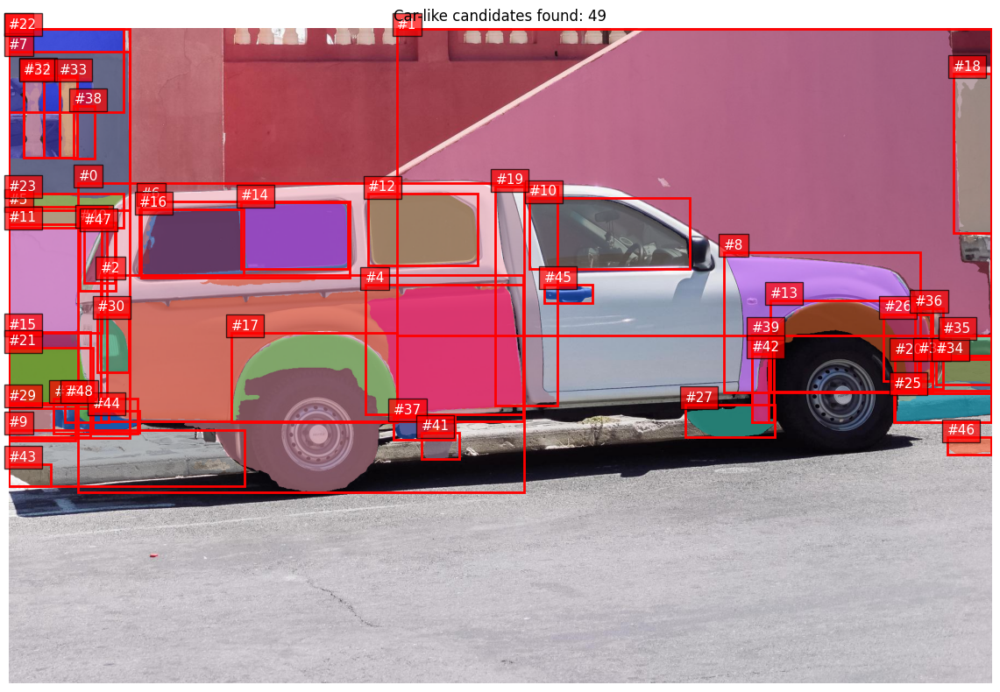

Количество объектов, похожих на машины: 49


,candidate_id,area,area_frac,aspect_ratio,extent,predicted_iou,stability_score,bbox
0,0,355254,0.164469,1.443463,0.768246,0.943670,0.956391,"[127, 283, 817, 566]"
1,1,316245,0.146410,1.935943,0.517200,0.875294,0.888259,"[711, 0, 1088, 562]"
2,2,126120,0.058389,2.888060,0.608006,0.887513,0.889890,"[168, 451, 774, 268]"
3,3,120500,0.055787,3.393665,0.726998,0.951094,0.844889,"[0, 0, 221, 750]"
4,4,52659,0.024379,1.224576,0.772081,0.895148,0.943418,"[652, 470, 289, 236]"
5,5,49515,0.022924,2.061453,0.749648,0.845303,0.845496,"[0, 327, 179, 369]"
6,6,44628,0.020661,2.728571,0.834480,0.963361,0.927215,"[242, 316, 382, 140]"
7,7,43036,0.019924,1.316742,0.669186,0.895065,0.862415,"[0, 42, 221, 291]"
8,8,32681,0.015130,1.406250,0.354612,0.857171,0.825381,"[1309, 410, 360, 256]"
9,9,31883,0.014761,4.184466,0.718199,0.878570,0.865364,"[0, 735, 431, 103]"


In [ ]:
# ==================================================================
# TASK 3 ANALYTICAL: COUNT CAR-LIKE OBJECTS USING SAM + HEURISTICS
# ==================================================================

def count_car_like_objects(
    image_rgb,
    model=sam,
    points_per_side=24,
    min_area_frac=0.0008,
    max_area_frac=0.20,
    min_aspect_ratio=1.15,
    max_aspect_ratio=5.0,
    min_extent=0.18,
    max_extent=0.95,
    min_predicted_iou=0.80,
    min_stability_score=0.80,
    visualize=True,
):
    """
    Uses SAM automatic masks and simple geometric heuristics to count car-like objects.

    Heuristics:
        - reasonable mask area
        - rectangular-ish bbox
        - bbox aspect ratio typical for side/front views of vehicles
        - enough area inside bbox
        - acceptable SAM predicted_iou and stability_score

    Works best on parking lots / street scenes.
    For other images, adjust thresholds.
    """
    h, w = image_rgb.shape[:2]
    image_area = h * w

    generator = make_auto_mask_generator(
        model=model,
        points_per_side=points_per_side,
        pred_iou_thresh=0.78,
        stability_score_thresh=0.80,
        crop_n_layers=1,
        min_mask_region_area=max(50, int(image_area * min_area_frac / 2)),
    )

    print("Generating automatic masks...")
    anns = generator.generate(image_rgb)

    candidates = []

    for ann in anns:
        x, y, bw, bh = ann["bbox"]  # SAM bbox format is [x, y, width, height]
        area = ann["area"]
        predicted_iou = ann["predicted_iou"]
        stability = ann["stability_score"]

        if bw <= 0 or bh <= 0:
            continue

        area_frac = area / image_area
        aspect_ratio = max(bw / bh, bh / bw)
        extent = area / (bw * bh)

        is_candidate = (
            min_area_frac <= area_frac <= max_area_frac
            and min_aspect_ratio <= aspect_ratio <= max_aspect_ratio
            and min_extent <= extent <= max_extent
            and predicted_iou >= min_predicted_iou
            and stability >= min_stability_score
        )

        if is_candidate:
            candidates.append({
                "bbox": [x, y, bw, bh],
                "area": area,
                "area_frac": area_frac,
                "aspect_ratio": aspect_ratio,
                "extent": extent,
                "predicted_iou": predicted_iou,
                "stability_score": stability,
                "segmentation": ann["segmentation"],
            })

    candidates = sorted(candidates, key=lambda item: item["area"], reverse=True)

    stats_df = pd.DataFrame([
        {
            "candidate_id": i,
            "area": c["area"],
            "area_frac": c["area_frac"],
            "aspect_ratio": c["aspect_ratio"],
            "extent": c["extent"],
            "predicted_iou": c["predicted_iou"],
            "stability_score": c["stability_score"],
            "bbox": c["bbox"],
        }
        for i, c in enumerate(candidates)
    ])

    if visualize:
        candidate_masks = [c["segmentation"] for c in candidates]
        colored = overlay_masks(image_rgb, candidate_masks, alpha=0.50, seed=7)

        fig, ax = plt.subplots(1, 1, figsize=(13, 8))
        ax.imshow(colored)

        for i, c in enumerate(candidates):
            x, y, bw, bh = c["bbox"]
            rect = plt.Rectangle(
                (x, y), bw, bh,
                fill=False,
                edgecolor="red",
                linewidth=2,
            )
            ax.add_patch(rect)
            ax.text(
                x,
                max(0, y - 5),
                f"#{i}",
                color="white",
                fontsize=11,
                bbox=dict(facecolor="red", alpha=0.7),
            )

        ax.set_title(f"Car-like candidates found: {len(candidates)}")
        ax.axis("off")
        plt.tight_layout()
        plt.show()

    return {
        "count": len(candidates),
        "candidates": candidates,
        "stats_df": stats_df,
        "all_masks": anns,
    }


analytical_image = image

analytical_result = count_car_like_objects(
    image_rgb=analytical_image,
    model=sam,
    points_per_side=24,
    min_area_frac=0.0008,
    max_area_frac=0.25,
    min_aspect_ratio=1.15,
    max_aspect_ratio=5.0,
    min_extent=0.18,
    max_extent=0.95,
    min_predicted_iou=0.80,
    min_stability_score=0.80,
    visualize=True,
)

print("Количество объектов, похожих на машины:", analytical_result["count"])
display(analytical_result["stats_df"])


Benchmarking vit_b...
Downloading: sam_vit_l_0b3195.pth
100.0% downloaded
Saved to checkpoints/sam_vit_l_0b3195.pth

Benchmarking vit_l...
Downloading: sam_vit_h_4b8939.pth
100.0% downloaded
Saved to checkpoints/sam_vit_h_4b8939.pth

Benchmarking vit_h...


,model_type,load_time_sec,inference_time_sec,object_count,mean_predicted_iou,mean_stability_score,status
0,vit_b,1.124456,4.741820,46,0.937022,0.962587,ok
1,vit_l,3.758192,8.599640,67,0.958058,0.965485,ok
2,vit_h,7.979608,13.406866,61,0.958633,0.970248,ok


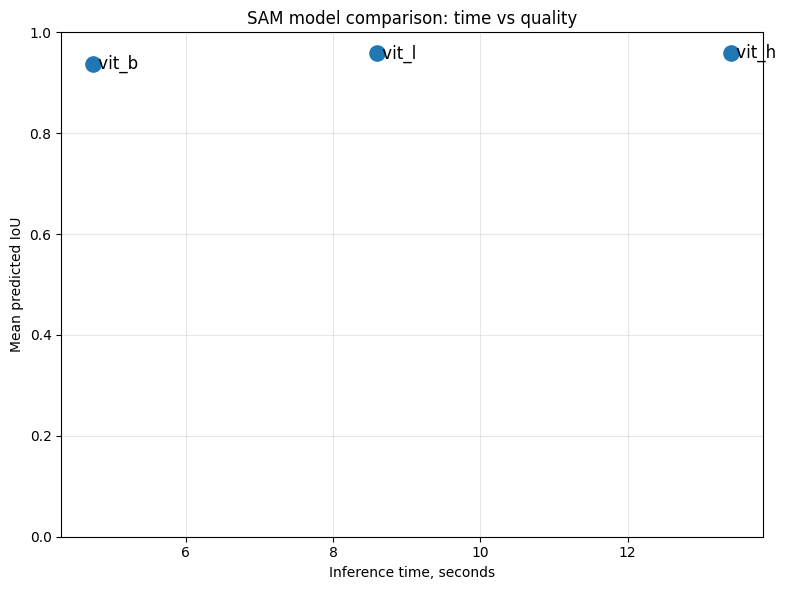

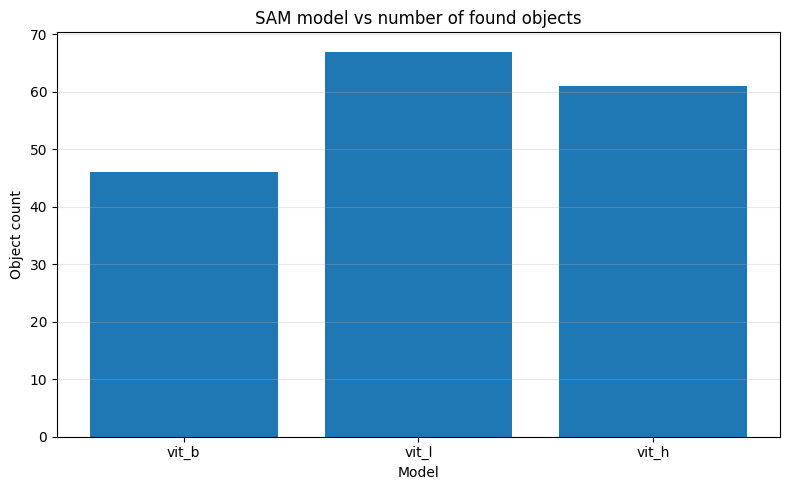

In [21]:
# ============================================================
# TASK 3 PERFORMANCE: COMPARE SAM ViT-B / ViT-L / ViT-H
# ============================================================

# This cell may download large checkpoints:
# vit_b ≈ 0.4 GB, vit_l ≈ 1.2 GB, vit_h ≈ 2.5 GB.
# It catches CUDA / RAM errors and records skipped models instead of crashing.

CHECKPOINT_DIR = Path("checkpoints")
CHECKPOINT_DIR.mkdir(exist_ok=True)

DOWNLOAD_MISSING_CHECKPOINTS = True

checkpoint_info = {
    "vit_b": {
        "path": CHECKPOINT_DIR / "sam_vit_b_01ec64.pth",
        "url": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth",
    },
    "vit_l": {
        "path": CHECKPOINT_DIR / "sam_vit_l_0b3195.pth",
        "url": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth",
    },
    "vit_h": {
        "path": CHECKPOINT_DIR / "sam_vit_h_4b8939.pth",
        "url": "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth",
    },
}


def download_file_stream(url, dst_path, chunk_size=1024 * 1024):
    """
    Downloads a large file with progress.
    """
    dst_path = Path(dst_path)
    if dst_path.exists() and dst_path.stat().st_size > 0:
        print(f"Already exists: {dst_path}")
        return

    print(f"Downloading: {dst_path.name}")
    with requests.get(url, stream=True, timeout=60) as r:
        r.raise_for_status()
        total = int(r.headers.get("content-length", 0))
        downloaded = 0

        with open(dst_path, "wb") as f:
            for chunk in r.iter_content(chunk_size=chunk_size):
                if chunk:
                    f.write(chunk)
                    downloaded += len(chunk)
                    if total > 0:
                        pct = downloaded / total * 100
                        print(f"\r{pct:5.1f}% downloaded", end="")

    print(f"\nSaved to {dst_path}")


def benchmark_sam_model(
    model_type,
    checkpoint_path,
    benchmark_image,
    points_per_side=16,
):
    """
    Loads one SAM model, runs automatic segmentation, and measures runtime / quality.
    """
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    gc.collect()

    print(f"\nBenchmarking {model_type}...")

    start_load = time.perf_counter()
    local_sam = sam_model_registry[model_type](checkpoint=str(checkpoint_path))
    local_sam.to(device=device)
    load_time = time.perf_counter() - start_load

    generator = make_auto_mask_generator(
        model=local_sam,
        points_per_side=points_per_side,
        pred_iou_thresh=0.86,
        stability_score_thresh=0.92,
        crop_n_layers=1,
        min_mask_region_area=150,
    )

    start_infer = time.perf_counter()
    anns = generator.generate(benchmark_image)
    inference_time = time.perf_counter() - start_infer

    object_count = len(anns)
    mean_iou = float(np.mean([ann["predicted_iou"] for ann in anns])) if anns else 0.0
    mean_stability = float(np.mean([ann["stability_score"] for ann in anns])) if anns else 0.0

    # Clean up memory before next model
    del generator
    del local_sam
    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return {
        "model_type": model_type,
        "load_time_sec": load_time,
        "inference_time_sec": inference_time,
        "object_count": object_count,
        "mean_predicted_iou": mean_iou,
        "mean_stability_score": mean_stability,
        "status": "ok",
    }


# Use a resized image for fair and faster comparison.
benchmark_image = image.copy()
max_side = 768
h, w = benchmark_image.shape[:2]
scale = min(1.0, max_side / max(h, w))
if scale < 1.0:
    benchmark_image = cv2.resize(
        benchmark_image,
        (int(w * scale), int(h * scale)),
        interpolation=cv2.INTER_AREA,
    )

performance_results = []

for model_type, info in checkpoint_info.items():
    ckpt_path = info["path"]

    try:
        if not ckpt_path.exists():
            if DOWNLOAD_MISSING_CHECKPOINTS:
                download_file_stream(info["url"], ckpt_path)
            else:
                performance_results.append({
                    "model_type": model_type,
                    "load_time_sec": np.nan,
                    "inference_time_sec": np.nan,
                    "object_count": np.nan,
                    "mean_predicted_iou": np.nan,
                    "mean_stability_score": np.nan,
                    "status": "checkpoint_missing",
                })
                continue

        result = benchmark_sam_model(
            model_type=model_type,
            checkpoint_path=ckpt_path,
            benchmark_image=benchmark_image,
            points_per_side=16,
        )
        performance_results.append(result)

    except Exception as e:
        print(f"Skipping {model_type} because of error: {repr(e)}")
        performance_results.append({
            "model_type": model_type,
            "load_time_sec": np.nan,
            "inference_time_sec": np.nan,
            "object_count": np.nan,
            "mean_predicted_iou": np.nan,
            "mean_stability_score": np.nan,
            "status": repr(e),
        })

performance_df = pd.DataFrame(performance_results)
display(performance_df)

# Required graph: time vs quality
ok_df = performance_df[performance_df["status"] == "ok"].copy()

if len(ok_df) > 0:
    plt.figure(figsize=(8, 6))
    plt.scatter(ok_df["inference_time_sec"], ok_df["mean_predicted_iou"], s=120)

    for _, row in ok_df.iterrows():
        plt.text(
            row["inference_time_sec"],
            row["mean_predicted_iou"],
            f" {row['model_type']}",
            fontsize=12,
            va="center",
        )

    plt.title("SAM model comparison: time vs quality")
    plt.xlabel("Inference time, seconds")
    plt.ylabel("Mean predicted IoU")
    plt.ylim(0, 1)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Extra useful graph: model vs object count
    plt.figure(figsize=(8, 5))
    plt.bar(ok_df["model_type"], ok_df["object_count"])
    plt.title("SAM model vs number of found objects")
    plt.xlabel("Model")
    plt.ylabel("Object count")
    plt.grid(axis="y", alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("No model finished successfully. Check checkpoint files, RAM/GPU memory, or set DOWNLOAD_MISSING_CHECKPOINTS=True.")

## Выводы

В ходе работы SAM успешно справился с интерактивной сегментацией: по 4 кликам было выделено 2 уникальных объекта, при этом повторные клики по одному и тому же объекту корректно объединились. Общая площадь выделенных объектов составила 622635 пикселей, а scores для найденных объектов были высокими: 0.984 и 0.949.

При автоматической сегментации лучше всего по среднему predicted IoU сработало изображение с людьми — 0.944, затем природа — 0.936 и городская сцена — 0.932. Больше всего объектов SAM нашёл на городской сцене: 47 объектов, что логично из-за большого количества деталей. На природе было найдено 20 объектов, а на изображении с людьми — 40 объектов.

Эффект «умного размытия фона» также сработал корректно: главный объект был выделен с score 0.984 и площадью 21589 пикселей. В аналитическом треке простые эвристики нашли 49 объектов, похожих на машины, но такой подход даёт много ложных срабатываний, поэтому для точного подсчёта объектов одного типа лучше комбинировать SAM с классификатором или детектором объектов.

Сравнение моделей показало ожидаемый компромисс между скоростью и качеством. ViT-B оказался самым быстрым: 4.74 секунды, но имел более низкий mean IoU — 0.937. ViT-L и ViT-H дали более высокое качество — около 0.958, однако ViT-H работал заметно медленнее: 13.41 секунды против 8.60 у ViT-L. Поэтому для практического использования оптимальным вариантом можно считать ViT-L, а если важна скорость — ViT-B.